### Main AR Puppet Loop

Now we'll implement the main loop. This will continuously capture frames from the webcam, process them to detect hand landmarks, and then display the output. We'll use a placeholder for drawing the puppet for now, focusing on the hand detection and display pipeline.

Starting AR Puppet loop. Grant webcam access when prompted.


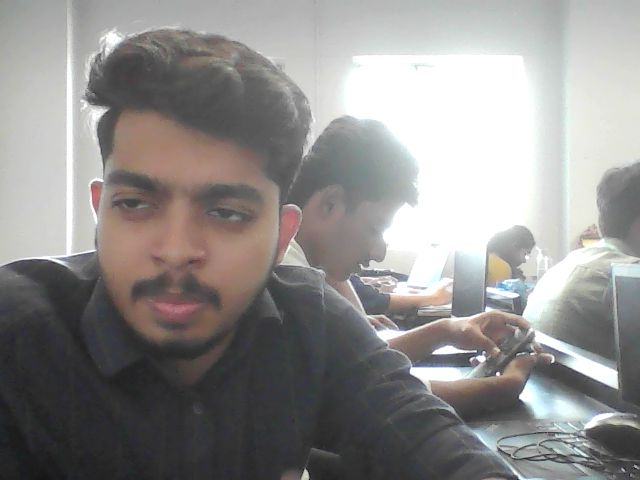

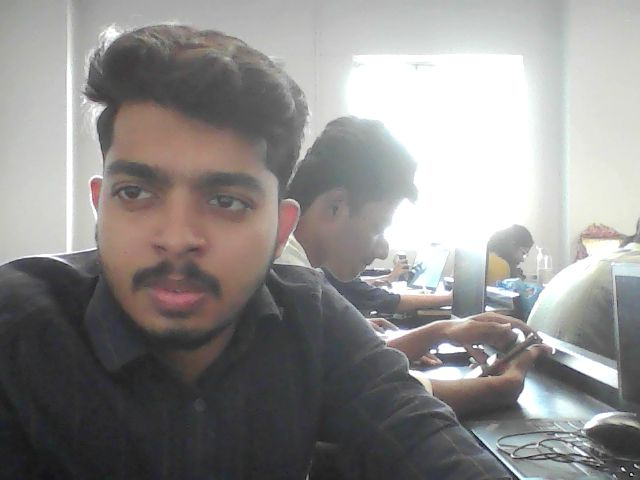

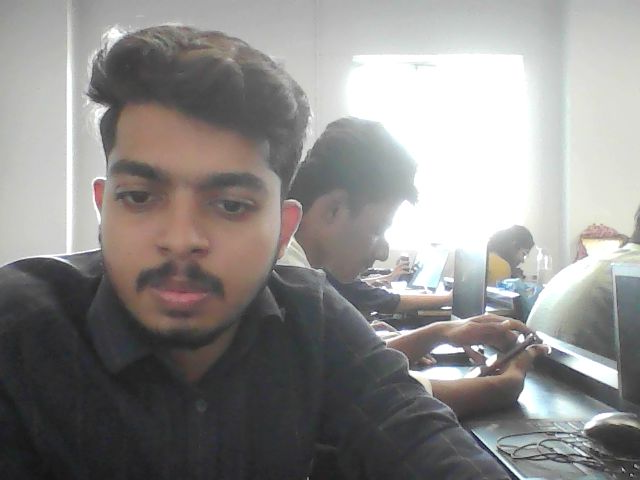

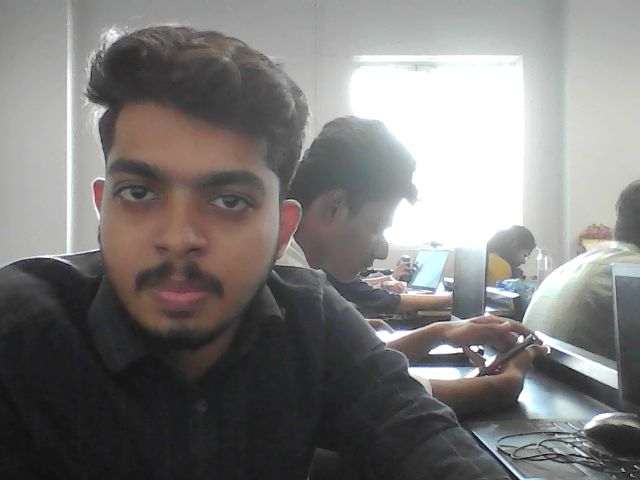

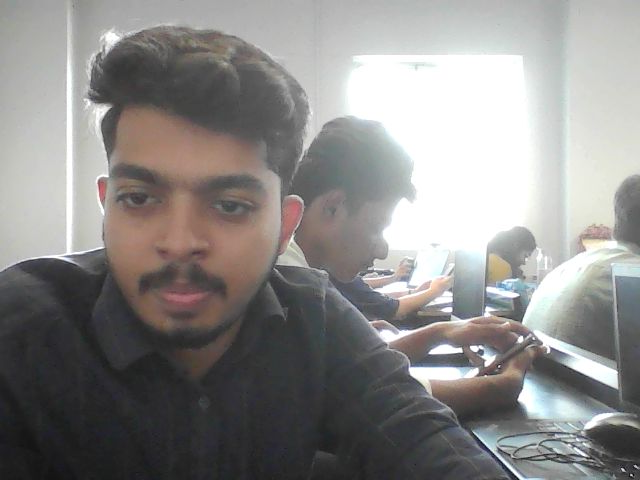

...

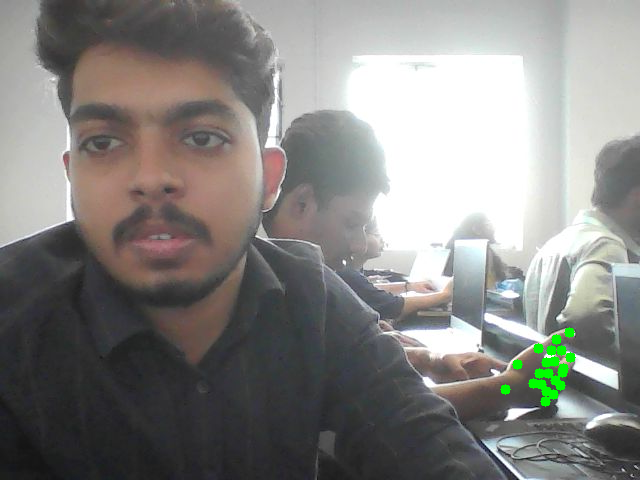

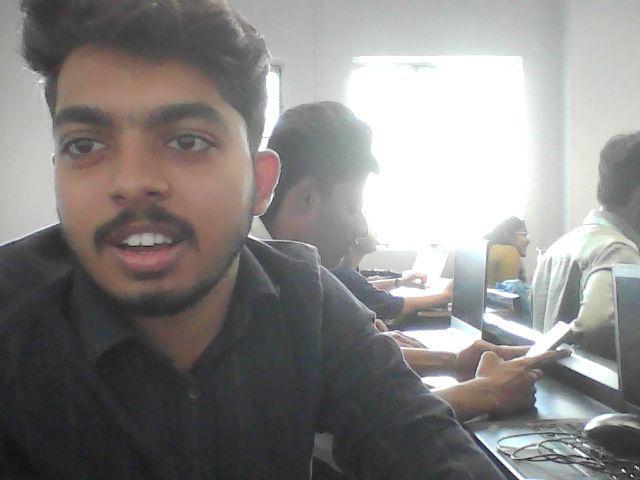

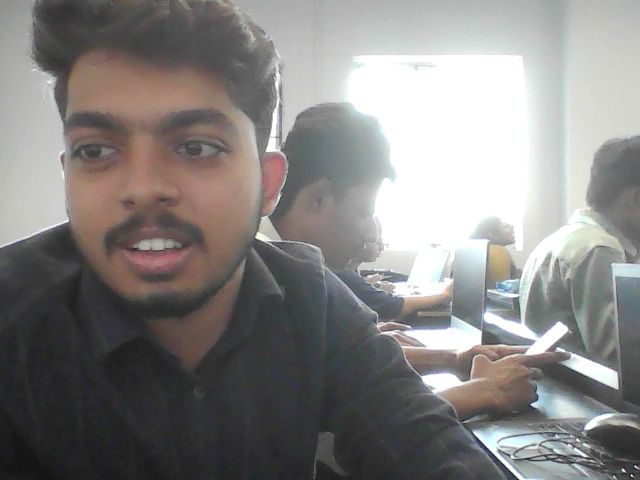

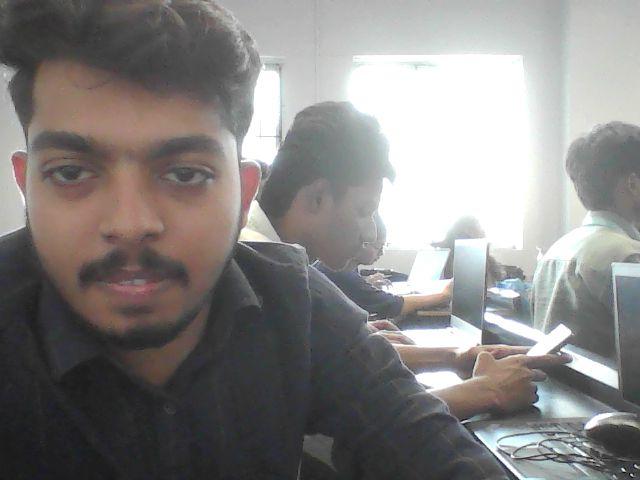

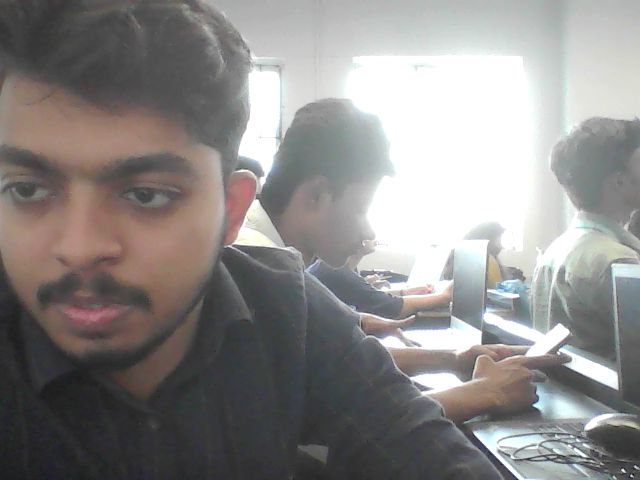

AR Puppet loop finished.


KeyboardInterrupt: 

In [13]:
import cv2
import mediapipe as mp
import mediapipe.tasks as tasks
from mediapipe.tasks.python import vision
import numpy as np
import os
from google.colab.patches import cv2_imshow
from IPython.display import display, Javascript, Image as IPImage
from base64 import b64decode
import io
import time # Added for potential delays
from google.colab.output import eval_js # Moved eval_js import to the top

# Re-initialize the detector in case the runtime was reset or model wasn't loaded globally
# This assumes model_path is still available from the previous cell or define it here if needed
model_path = 'hand_landmarker.task'
if not os.path.exists(model_path):
    print("Hand landmarker model not found. Please run the initialization cell again.")
    # Exit or handle error gracefully
else:
    base_options = tasks.BaseOptions(model_asset_path=model_path)
    options = vision.HandLandmarkerOptions(base_options=base_options, num_hands=1)
    detector = vision.HandLandmarker.create_from_options(options)


def get_webcam_frame_colab():
    js_code = '''
        (async () => {
            const div = document.createElement('div');
            const video = document.createElement('video');
            video.style.display = 'block';
            const stream = await navigator.mediaDevices.getUserMedia({video: true});

            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();

            // Resize the output to fit the display
            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

            // Wait for 1 second to let the video stream stabilize
            await new Promise((resolve) => setTimeout(resolve, 1000));

            const canvas = document.createElement('canvas');
            canvas.width = video.videoWidth;
            canvas.height = video.videoHeight;
            canvas.getContext('2d').drawImage(video, 0, 0);
            stream.getVideoTracks()[0].stop();
            div.remove();
            return canvas.toDataURL('image/jpeg', 0.8);
        })(); // Immediately-invoked async function expression
    '''
    data = eval_js(js_code) # Execute the entire JS block and get the return value
    jpeg_bytes = b64decode(data.split(',')[1])
    return cv2.imdecode(np.frombuffer(jpeg_bytes, np.uint8), cv2.IMREAD_COLOR)


print("Starting AR Puppet loop. Grant webcam access when prompted.")
try:
    # Loop indefinitely to capture frames
    while True:
        frame = get_webcam_frame_colab()
        if frame is None:
            print("Failed to capture frame from webcam. Please ensure permissions are granted and camera is active.")
            break

        # Convert the BGR image to RGB and flip it horizontally for a selfie-view display.
        # MediaPipe expects RGB input.
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        image = cv2.flip(image, 1) # Flip horizontally

        # Convert the image to a MediaPipe Image object
        mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=image)

        # Perform hand landmark detection
        detection_result = detector.detect(mp_image)

        # Draw landmarks on the image
        if detection_result.hand_landmarks:
            for hand_landmarks in detection_result.hand_landmarks:
                # For mediapipe.tasks, drawing utilities need to be implemented or sourced differently.
                # For now, we'll draw simple circles at landmark positions.
                for landmark in hand_landmarks:
                    x, y = int(landmark.x * image.shape[1]), int(landmark.y * image.shape[0])
                    cv2.circle(image, (x, y), 5, (0, 255, 0), -1) # Green circles

        # Convert back to BGR for cv2_imshow and display
        display_image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

        # Encode the image to JPEG for display in Colab
        _, encimg = cv2.imencode('.jpeg', display_image)
        cv2_imshow(display_image) # Use cv2_imshow for Colab to show live feed

        # Small delay to prevent overwhelming the browser/kernel
        time.sleep(0.01) # Add a small delay

except Exception as e:
    print(f"An error occurred: {e}")
finally:
    print("AR Puppet loop finished.")
    # In Colab, there's no cap.release() for this method, but we can clean up any other resources if applicable.


### Hand-Tracking AR Puppet Setup

First, we need to install the `mediapipe` library, which provides the hand tracking capabilities.

In [1]:
pip install mediapipe opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 45.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 6.2 MB/s eta 0:00:00
  Attempting uninstall: absl-py
    Found existing installation: absl-py 1.4.0
    Uninstalling absl-py-1.4.0:
      Successfully uninstalled absl-py-1.4.0


Now, let's import the required libraries and initialize MediaPipe's hand tracking module.

In [7]:
import cv2
import mediapipe as mp
import mediapipe.tasks as tasks
from mediapipe.tasks.python import vision
import os
import urllib.request

# Download the hand landmarker model
model_path = 'hand_landmarker.task'
if not os.path.exists(model_path):
    print(f"Downloading hand landmarker model to {model_path}...")
    urllib.request.urlretrieve('https://storage.googleapis.com/mediapipe-models/hand_landmarker/hand_landmarker/float16/1/hand_landmarker.task', model_path)
    print("Download complete.")
else:
    print(f"Hand landmarker model already exists at {model_path}.")

# Initialize MediaPipe HandLandmarker
base_options = tasks.BaseOptions(model_asset_path=model_path)
options = vision.HandLandmarkerOptions(base_options=base_options, num_hands=1)
detector = vision.HandLandmarker.create_from_options(options)

# Drawing utilities will be handled differently with mediapipe.tasks, as mp.solutions.drawing_utils
# might not be available directly. We will address drawing later if needed.

print("Libraries loaded and MediaPipe HandLandmarker initialized.")
print("Note: Drawing utilities will need to be handled separately or custom implemented for mediapipe.tasks.")

Download complete.
Libraries loaded and MediaPipe HandLandmarker initialized.
Note: Drawing utilities will need to be handled separately or custom implemented for mediapipe.tasks.


Next, we'll set up the webcam to capture video. We'll start by ensuring we can open the webcam feed and display a single frame.

In [5]:
import cv2
from IPython.display import display, Image as IPImage
import numpy as np

cap = cv2.VideoCapture(0) # 0 for default webcam

if not cap.isOpened():
    print("Error: Could not open video stream. Please ensure you grant webcam access and your browser supports it.")
    print("In Colab, direct cv2.VideoCapture(0) for a physical webcam might be limited.")
    print("You might need to use a Javascript workaround or upload a video file for testing.")
else:
    print("Webcam opened successfully. Showing a test frame...")
    ret, frame = cap.read()
    if ret:
        # Convert the frame to RGB for displaying with IPython.display
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        _, encimg = cv2.imencode(".jpeg", frame_rgb)
        display(IPImage(data=encimg.tobytes()))

        print("Test frame shown. You can now run the main loop to start AR puppet.")
        cap.release() # Release camera after testing
    else:
        print("Error: Could not read frame from webcam.")
        cap.release() # Release camera if frame read fails

cv2.destroyAllWindows() # Good practice, though might not do anything in Colab

Error: Could not open video stream. Please ensure you grant webcam access and your browser supports it.
In Colab, direct cv2.VideoCapture(0) for a physical webcam might be limited.
You might need to use a Javascript workaround or upload a video file for testing.
